## **Data / Mobile Consumption Rate**

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

**Data procesing and collection**

In [2]:
df = pd.read_csv('../Data/user_behavior_dataset.csv')
df.head()

,User ID,Device Model,Operating System,App Usage Time (min/day),Screen On Time (hours/day),Battery Drain (mAh/day),Number of Apps Installed,Data Usage (MB/day),Age,Gender,User Behavior Class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


In [3]:
# checking to know more about our data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700 entries, 0 to 699
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   User ID                     700 non-null    int64  
 1   Device Model                700 non-null    object 
 2   Operating System            700 non-null    object 
 3   App Usage Time (min/day)    700 non-null    int64  
 4   Screen On Time (hours/day)  700 non-null    float64
 5   Battery Drain (mAh/day)     700 non-null    int64  
 6   Number of Apps Installed    700 non-null    int64  
 7   Data Usage (MB/day)         700 non-null    int64  
 8   Age                         700 non-null    int64  
 9   Gender                      700 non-null    object 
 10  User Behavior Class         700 non-null    int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 60.3+ KB


In [4]:
row, columns = df.shape
row, columns

(700, 11)

In [5]:
# checking for size
row * columns

7700

In [6]:
# Statistical description 
df.describe()

,User ID,App Usage Time (min/day),Screen On Time (hours/day),Battery Drain (mAh/day),Number of Apps Installed,Data Usage (MB/day),Age,User Behavior Class
count,700.00000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000
mean,350.50000,271.128571,5.272714,1525.158571,50.681429,929.742857,38.482857,2.990000
std,202.21688,177.199484,3.068584,819.136414,26.943324,640.451729,12.012916,1.401476
min,1.00000,30.000000,1.000000,302.000000,10.000000,102.000000,18.000000,1.000000
25%,175.75000,113.250000,2.500000,722.250000,26.000000,373.000000,28.000000,2.000000
50%,350.50000,227.500000,4.900000,1502.500000,49.000000,823.500000,38.000000,3.000000
75%,525.25000,434.250000,7.400000,2229.500000,74.000000,1341.000000,49.000000,4.000000
max,700.00000,598.000000,12.000000,2993.000000,99.000000,2497.000000,59.000000,5.000000


## **Data Cleaning**

In [7]:
# checking for mising values
print(f'This is the total number of null values: \n {df.isnull().sum().sum()}')

This is the total number of null values: 
 0


In [8]:
# checking for duplicates
df.duplicated().sum() 

np.int64(0)

In [9]:
df.head()

,User ID,Device Model,Operating System,App Usage Time (min/day),Screen On Time (hours/day),Battery Drain (mAh/day),Number of Apps Installed,Data Usage (MB/day),Age,Gender,User Behavior Class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


In [10]:
df.nunique(axis=0)

User ID                       700
Device Model                    5
Operating System                2
App Usage Time (min/day)      387
Screen On Time (hours/day)    108
Battery Drain (mAh/day)       628
Number of Apps Installed       86
Data Usage (MB/day)           585
Age                            42
Gender                          2
User Behavior Class             5
dtype: int64

In [ ]:
df.columns = df.columns.str.lower().str.replace(' ', '_').str.capitalize()

In [12]:
df.columns

Index(['User_id', 'Device_model', 'Operating_system',
       'App_usage_time_(min/day)', 'Screen_on_time_(hours/day)',
       'Battery_drain_(mah/day)', 'Number_of_apps_installed',
       'Data_usage_(mb/day)', 'Age', 'Gender', 'User_behavior_class'],
      dtype='object')

In [13]:
df.head()

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


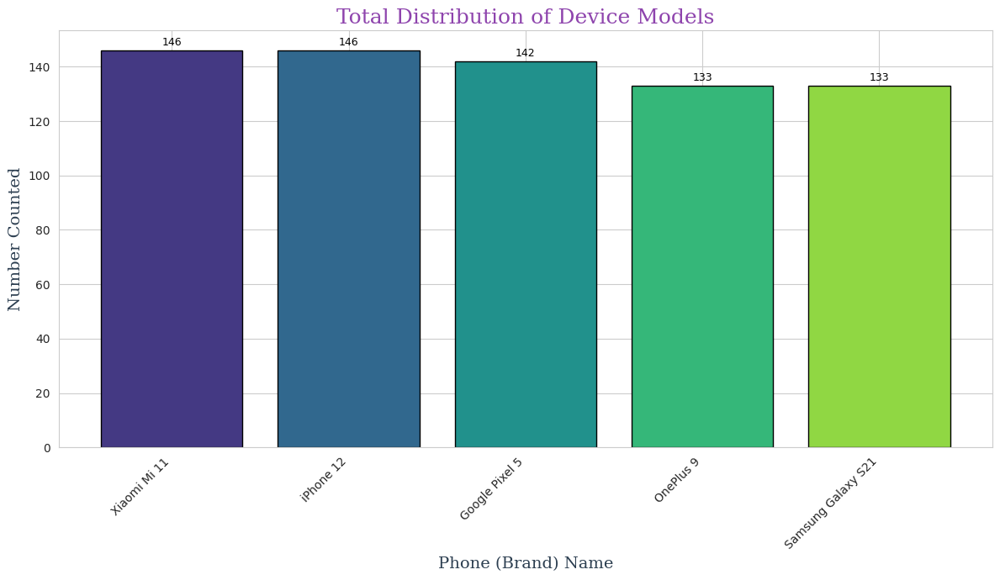

In [15]:
device_model = df['Device_model'].value_counts()

sns.set_style("whitegrid")


colors = sns.color_palette("viridis", len(device_model))    # Define a beautiful color palette


plt.figure(figsize=(12, 7))
bars = plt.bar(device_model.index, device_model.values, color=colors, edgecolor='black')

plt.xlabel('Phone (Brand) Name', fontdict={'family': 'serif', 'size': 14, 'color': '#2c3e50'})
plt.ylabel('Number Counted', fontdict={'family': 'serif', 'size': 14, 'color': '#2c3e50'})
plt.title('Total Distribution of Device Models', fontdict={'family': 'serif', 'size': 18, 'color': '#8e44ad'})


plt.xticks(rotation=45, ha='right', fontsize=10)

# Annotate each bar with its value
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, str(height), 
             ha='center', va='bottom', fontsize=9, color='black')

plt.tight_layout()
plt.show()


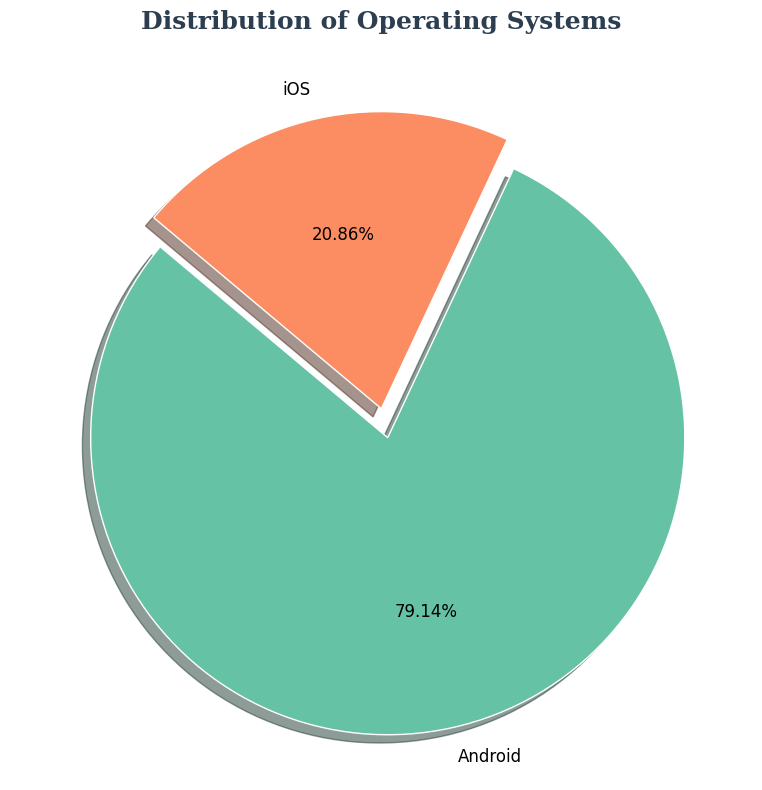

In [16]:
os_counts = df['Operating_system'].value_counts()
os_labels = os_counts.index
explode_values = [0.1 if i == os_counts.idxmax() else 0 for i in os_labels]  # explode the largest slice

colors = sns.color_palette("Set2", len(os_counts))  # choose a colorful, soft palette

# Plot
plt.figure(figsize=(8, 8))
plt.pie(
    x=os_counts,
    labels=os_labels,
    autopct="%.2f%%",
    explode=explode_values,
    shadow=True,
    startangle=140,
    colors=colors,
    textprops={'fontsize': 12, 'color': 'black'}
)


plt.title("Distribution of Operating Systems", fontsize=18, color="#2c3e50", fontweight='bold', family='serif')
plt.tight_layout()
plt.show()


In [18]:
df.head()

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


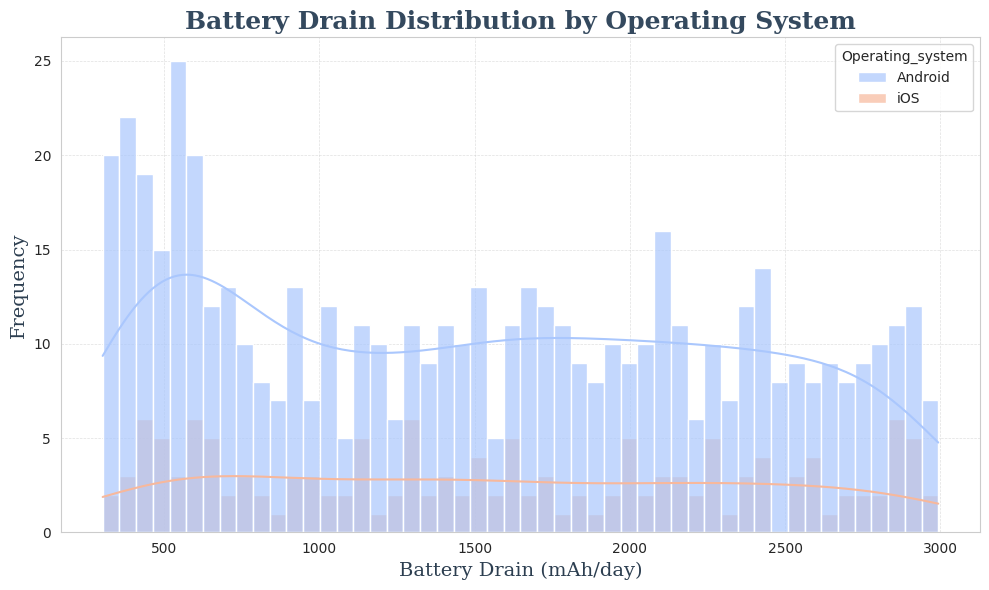

In [ ]:
sns.set_style("whitegrid")
palette = sns.color_palette("coolwarm", n_colors=df['Operating_system'].nunique())

plt.figure(figsize=(10, 6))
sns.histplot(
    data=df,
    x='Battery_drain_(mah/day)',
    bins=50,
    hue='Operating_system',
    kde=True,
    palette=palette,
    alpha=0.7,
    edgecolor=None
)

plt.title('Battery Drain Distribution by Operating System', fontsize=18, fontweight='bold', color='#34495e', family='serif')
plt.xlabel('Battery Drain (mAh/day)', fontsize=14, color='#2c3e50', family='serif')
plt.ylabel('Frequency', fontsize=14, color='#2c3e50', family='serif')

plt.grid(visible=True, linestyle='--', linewidth=0.5, alpha=0.6)
plt.tight_layout()
plt.show()


In [20]:
df.head()

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


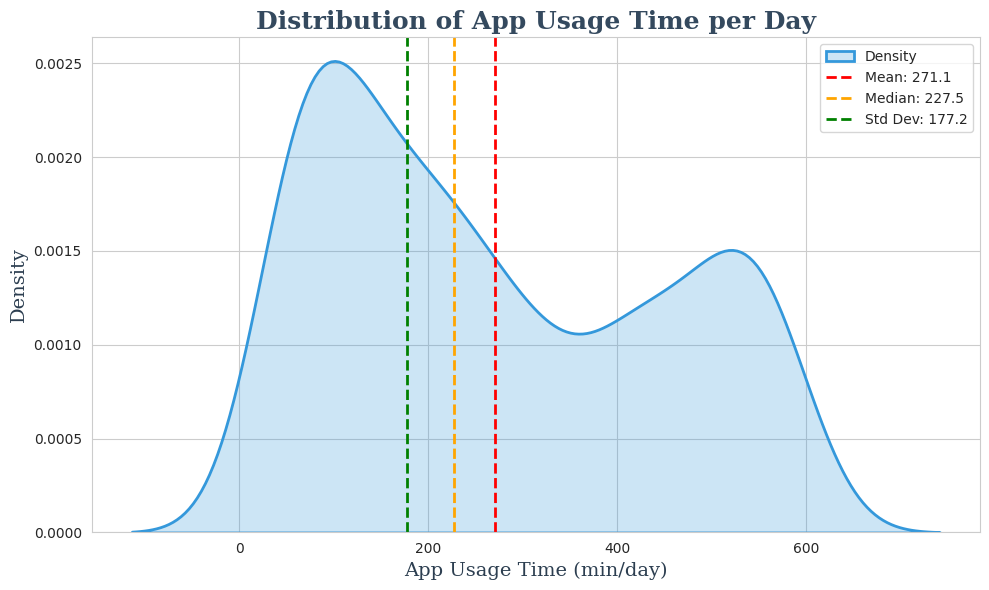

In [19]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.kdeplot(data=df['App_usage_time_(min/day)'], fill=True, color="#3498db", linewidth=2, label="Density")

mean_val = df['App_usage_time_(min/day)'].mean()
median_val = df['App_usage_time_(min/day)'].median()
std_val = df['App_usage_time_(min/day)'].std()

plt.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.1f}')
plt.axvline(median_val, color='orange', linestyle='--', linewidth=2, label=f'Median: {median_val:.1f}')
plt.axvline(std_val, color='green', linestyle='--', linewidth=2, label=f'Std Dev: {std_val:.1f}')

plt.xlabel("App Usage Time (min/day)", fontsize=14, color="#2c3e50", family='serif')
plt.ylabel("Density", fontsize=14, color="#2c3e50", family='serif')
plt.title("Distribution of App Usage Time per Day", fontsize=18, fontweight='bold', color='#34495e', family='serif')

plt.legend(fontsize=10)
plt.tight_layout()
plt.show()


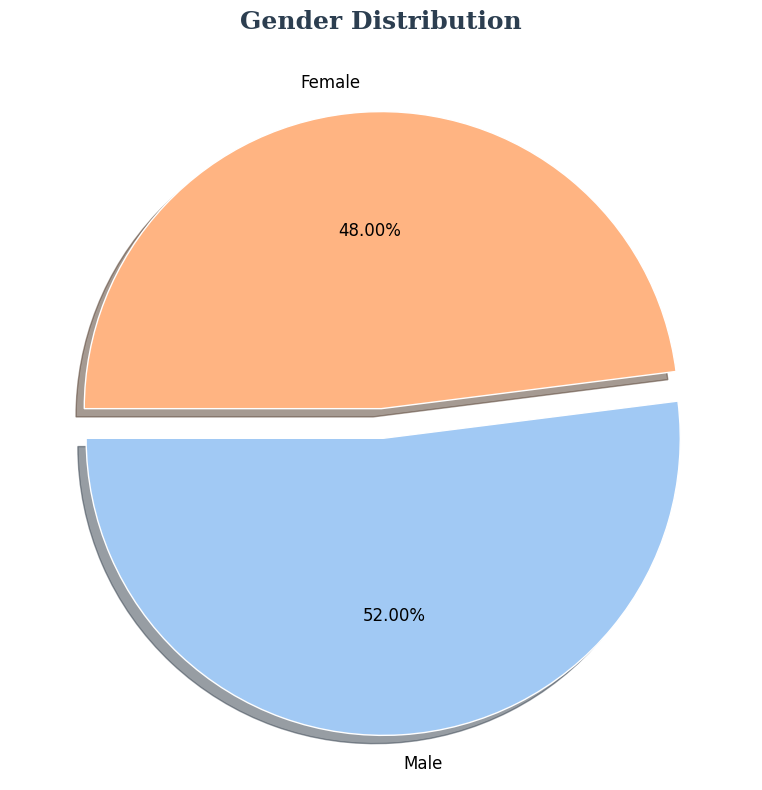

In [20]:
gender = df['Gender'].value_counts()
labels = gender.index
values = gender.values

explode = [0.1 if val == max(values) else 0 for val in values]
colors = sns.color_palette("pastel")[0:len(gender)]
plt.figure(figsize=(8, 8))
plt.pie(
    x=values,
    labels=labels,
    autopct='%.2f%%',
    explode=explode,
    shadow=True,
    startangle=180,
    colors=colors,
    textprops={'fontsize': 12, 'color': 'black'}
)

plt.title("Gender Distribution", fontsize=18, fontweight='bold', color='#2c3e50', family='serif')
plt.tight_layout()
plt.show()


In [24]:
df.groupby('Device_model')['Data_usage_(mb/day)'].count()

Device_model
Google Pixel 5        142
OnePlus 9             133
Samsung Galaxy S21    133
Xiaomi Mi 11          146
iPhone 12             146
Name: Data_usage_(mb/day), dtype: int64

In [28]:
def plot_pairgrid(*, df: pd.DataFrame, vars: list=None, hue: str=None, palette:str='Set2'):
    """
    Plots a Seaborn PairGrid with histograms on the diagonal and scatterplots
    off-diagonal, each with vertical or horizontal mean lines.
    
    Parameters:
        df (pd.DataFrame): DataFrame containing the data
        vars (list): List of column names to include in the pairgrid
        hue (str): Column name to color by group
        palette (str or list): Color palette for hue categories
    """
    plt.figure(figsize= (20, 17))
    
    grid = sns.PairGrid(df, vars=vars, hue=hue, palette=palette, diag_sharey=False)
    
    def diag_hist(x, color, **kwargs):
        ax = plt.gca()
        sns.histplot(x, kde=False, color=color, ax=ax, **kwargs)
        ax.legend()

    def offdiag_scatter(x, y, color, **kwargs):
        ax = plt.gca()
        ax.scatter(x, y, alpha=0.6, color=color, **kwargs)
        
    grid.map_diag(diag_hist)
    grid.map_offdiag(offdiag_scatter)

    if hue:
        grid.add_legend()

    plt.subplots_adjust(top=0.95)

    plt.show()


<Figure size 2000x1700 with 0 Axes>

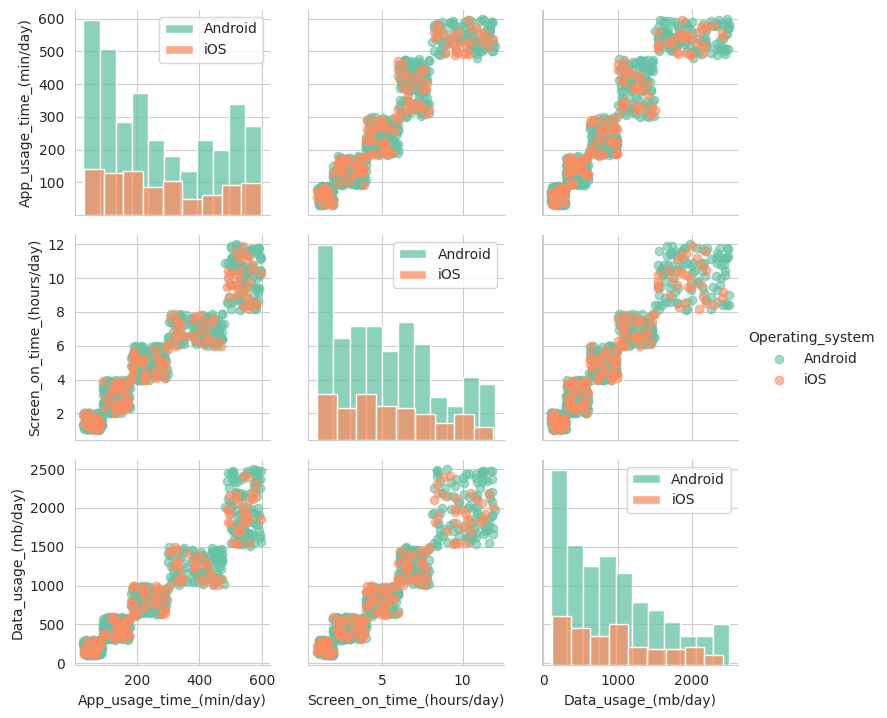

In [29]:
var = ['App_usage_time_(min/day)', 'Screen_on_time_(hours/day)','Data_usage_(mb/day)']
plot_pairgrid(df= df, vars= var, hue = 'Operating_system')

In [30]:
df.head()

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


In [27]:
numerical_cols= df[['App_usage_time_(min/day)', 'Screen_on_time_(hours/day)','Battery_drain_(mah/day)', 'Number_of_apps_installed',
 'Data_usage_(mb/day)', 'Age', 'User_behavior_class']]

**correlation matrix**

In [28]:
numerical_cols.corr()

,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,User_behavior_class
App_usage_time_(min/day),1.000000,0.950333,0.956385,0.955253,0.942308,0.004382,0.970498
Screen_on_time_(hours/day),0.950333,1.000000,0.948983,0.946975,0.941322,0.017232,0.964581
Battery_drain_(mah/day),0.956385,0.948983,1.000000,0.961853,0.932276,-0.002722,0.978587
Number_of_apps_installed,0.955253,0.946975,0.961853,1.000000,0.934800,0.004034,0.981255
Data_usage_(mb/day),0.942308,0.941322,0.932276,0.934800,1.000000,0.003999,0.946734
Age,0.004382,0.017232,-0.002722,0.004034,0.003999,1.000000,-0.000563
User_behavior_class,0.970498,0.964581,0.978587,0.981255,0.946734,-0.000563,1.000000


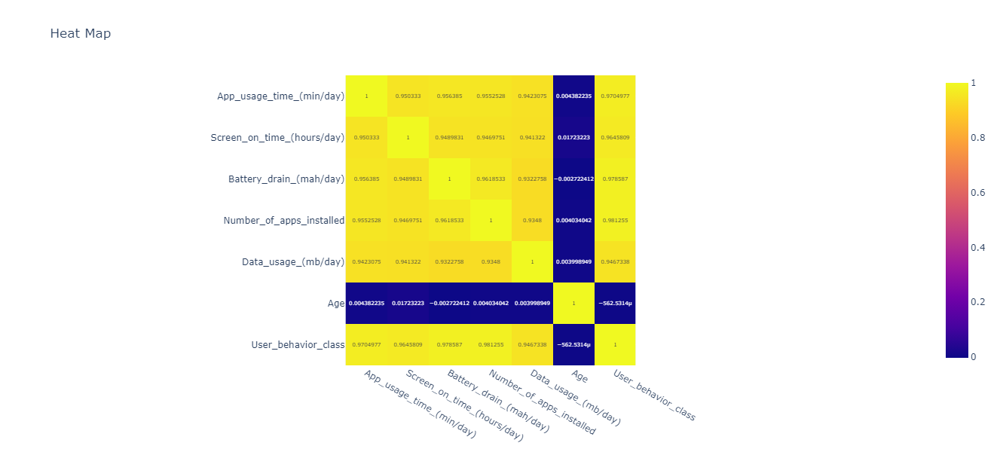

In [29]:
# plotting heatmap using plotly
px.imshow(
    numerical_cols.corr(),
    height= 600,
    width= 800,
    text_auto=True,
    title = "Heat Map"
    
)

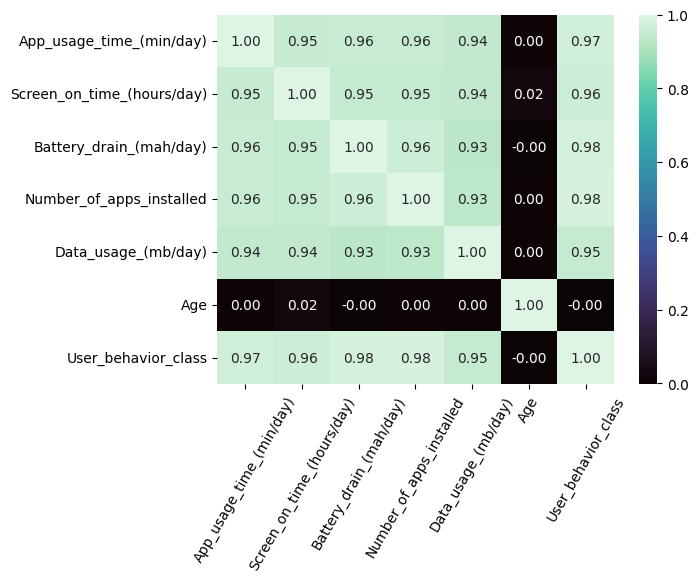

In [30]:
# using seaborn

sns.heatmap(numerical_cols.corr(), annot=True, cmap='mako', fmt='.2f')
plt.xticks(rotation= 60);

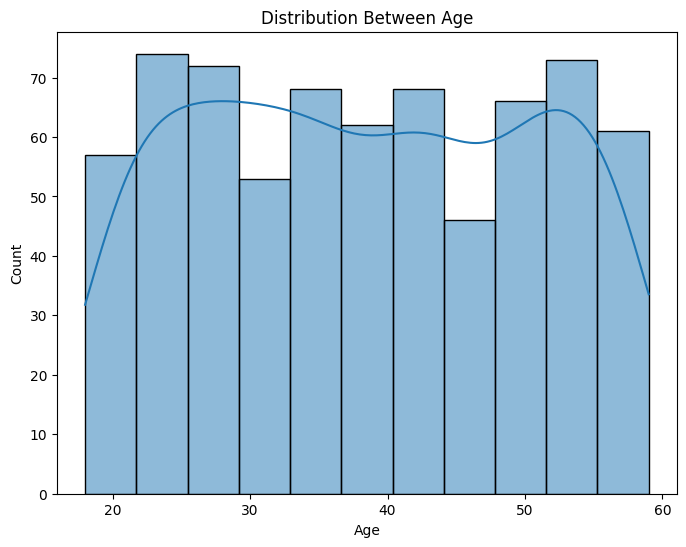

In [31]:
plt.figure(figsize = (8, 6))
sns.histplot(data= df, x= 'Age', kde= True)
plt.title("Distribution Between Age");

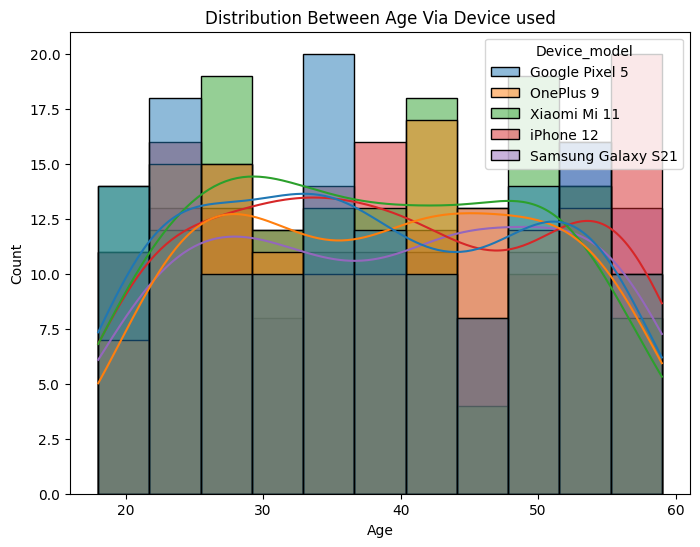

In [32]:
plt.figure(figsize = (8, 6))
sns.histplot(data= df, x= 'Age', kde= True, hue = 'Device_model')
plt.title("Distribution Between Age Via Device used");

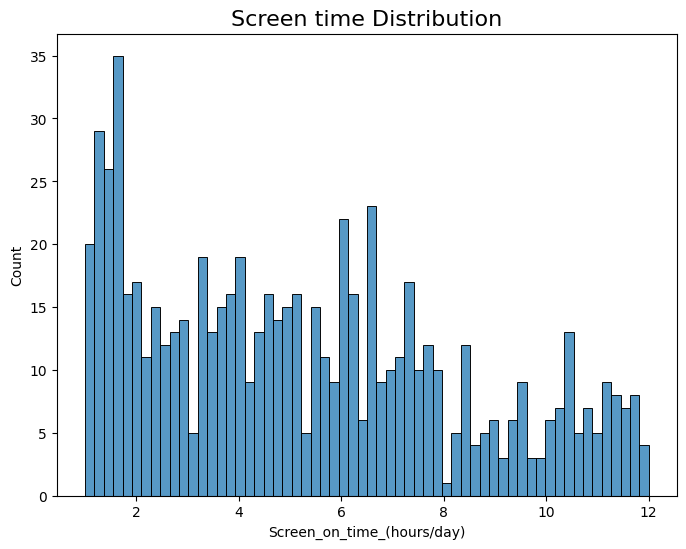

In [33]:
plt.figure(figsize= (8, 6))
sns.histplot(data= df, x = 'Screen_on_time_(hours/day)', bins= 60)
plt.title("Screen time Distribution", fontdict={'family': 'sans serif', 'size': 16})
plt.legend;

In [34]:
# what is the average battery usage of iphone 12 users

df.loc[(df['Device_model'] == 'iPhone 12'),'Battery_drain_(mah/day)'].mean().round(2)

1589.51

In [35]:
# Another easier and faster way

df.groupby(['Device_model', 'Gender'])['Battery_drain_(mah/day)'].mean().sort_values(ascending= False)

# showing th avarage battery for each particular phone product per age

Device_model        Gender
iPhone 12           Female    1602.283784
Samsung Galaxy S21  Female    1578.833333
iPhone 12           Male      1576.388889
OnePlus 9           Male      1551.138889
Xiaomi Mi 11        Male      1544.720588
Google Pixel 5      Male      1532.589041
Xiaomi Mi 11        Female    1515.064103
OnePlus 9           Female    1491.639344
Samsung Galaxy S21  Male      1453.810127
Google Pixel 5      Female    1415.463768
Name: Battery_drain_(mah/day), dtype: float64

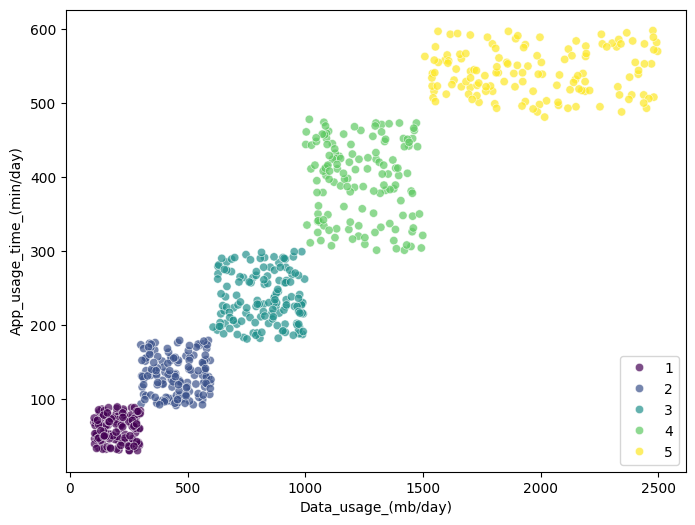

In [36]:
# plotting to see how different people behave data usage per app usage time

plt.figure(figsize= (8, 6))
sns.scatterplot(data= df, x = 'Data_usage_(mb/day)', y= 'App_usage_time_(min/day)', hue= 'User_behavior_class', palette='viridis', alpha= 0.7)
plt.legend(loc = 'lower right');

In [37]:
df.head()

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


In [38]:
# checking the number of apps installed in a device

device_app= df.groupby('Device_model')['Number_of_apps_installed'].agg(['count','mean']).sort_values(by = 'count', ascending=False)
device_app

,count,mean
Device_model,,
Xiaomi Mi 11,146,49.924658
iPhone 12,146,52.726027
Google Pixel 5,142,49.908451
OnePlus 9,133,49.969925
Samsung Galaxy S21,133,50.804511


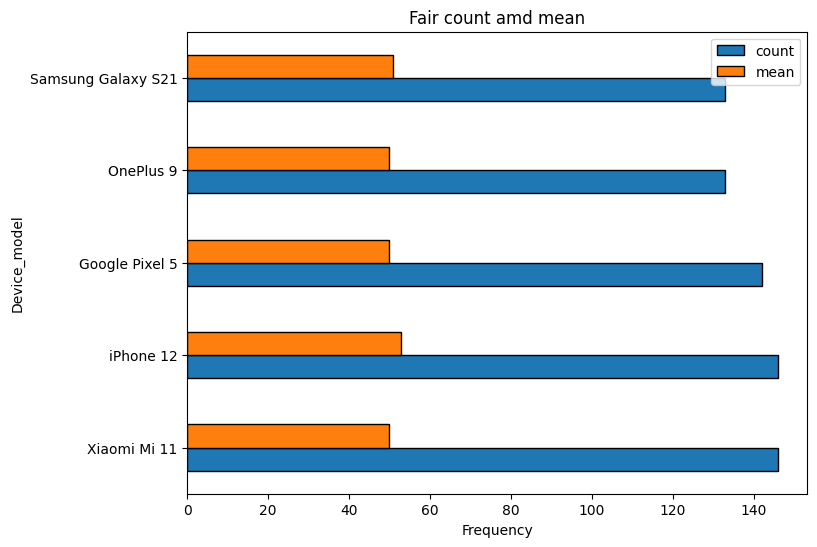

In [39]:
device_app.plot(kind= 'barh', figsize= (8, 6),edgecolor= 'black')
plt.xlabel('Frequency')
plt.title('Fair count amd mean');

In [40]:
df.head()

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


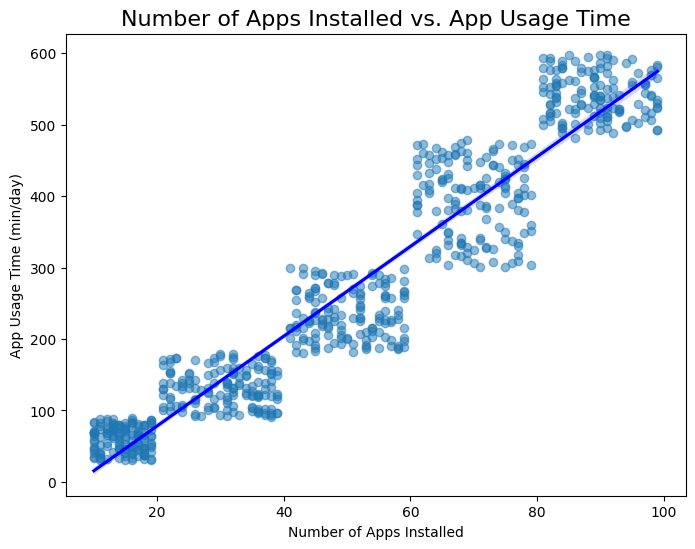

In [41]:
plt.figure(figsize=(8, 6))
sns.regplot(x='Number_of_apps_installed', y='App_usage_time_(min/day)', data=df, scatter_kws={'alpha':0.5}, line_kws={'color':'blue'})
plt.title('Number of Apps Installed vs. App Usage Time', fontsize=16)
plt.xlabel('Number of Apps Installed')
plt.ylabel('App Usage Time (min/day)')
plt.show()

In [42]:
# finding the average data usage across different phone devices

df.groupby('Device_model')['Data_usage_(mb/day)'].mean().sort_values(ascending= False)

Device_model
iPhone 12             965.506849
Xiaomi Mi 11          940.164384
Samsung Galaxy S21    931.872180
OnePlus 9             911.120301
Google Pixel 5        897.704225
Name: Data_usage_(mb/day), dtype: float64

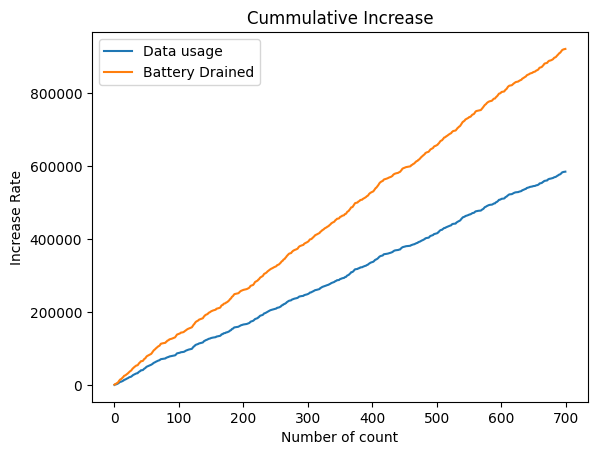

In [43]:
# checking the cummulative increase in the data ussage of those above 200

df.loc[(df['Data_usage_(mb/day)'] >= 500), 'Data_usage_(mb/day)'].cumsum().sort_values(ascending= False).plot(label= 'Data usage')
df.loc[(df['Data_usage_(mb/day)'] >= 500), 'Battery_drain_(mah/day)'].cumsum().sort_values(ascending= False).plot(label= 'Battery Drained')
plt.ylabel('Increase Rate')
plt.title('Cummulative Increase')
plt.xlabel('Number of count')
plt.legend();

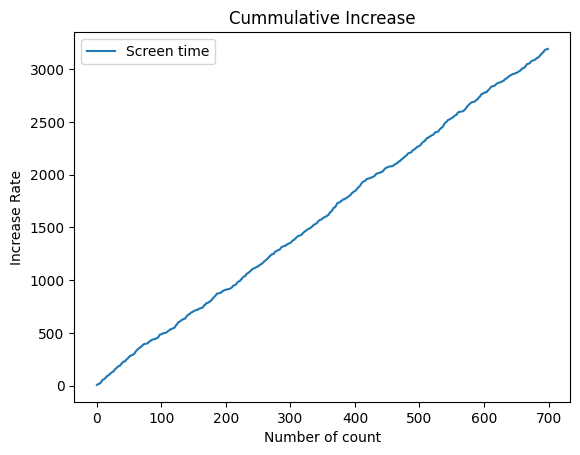

In [44]:
df.loc[(df['Data_usage_(mb/day)'] >= 500), 'Screen_on_time_(hours/day)'].cumsum().sort_values(ascending= False).plot(label= 'Screen time')
plt.ylabel('Increase Rate')
plt.title('Cummulative Increase')
plt.xlabel('Number of count')
plt.legend();

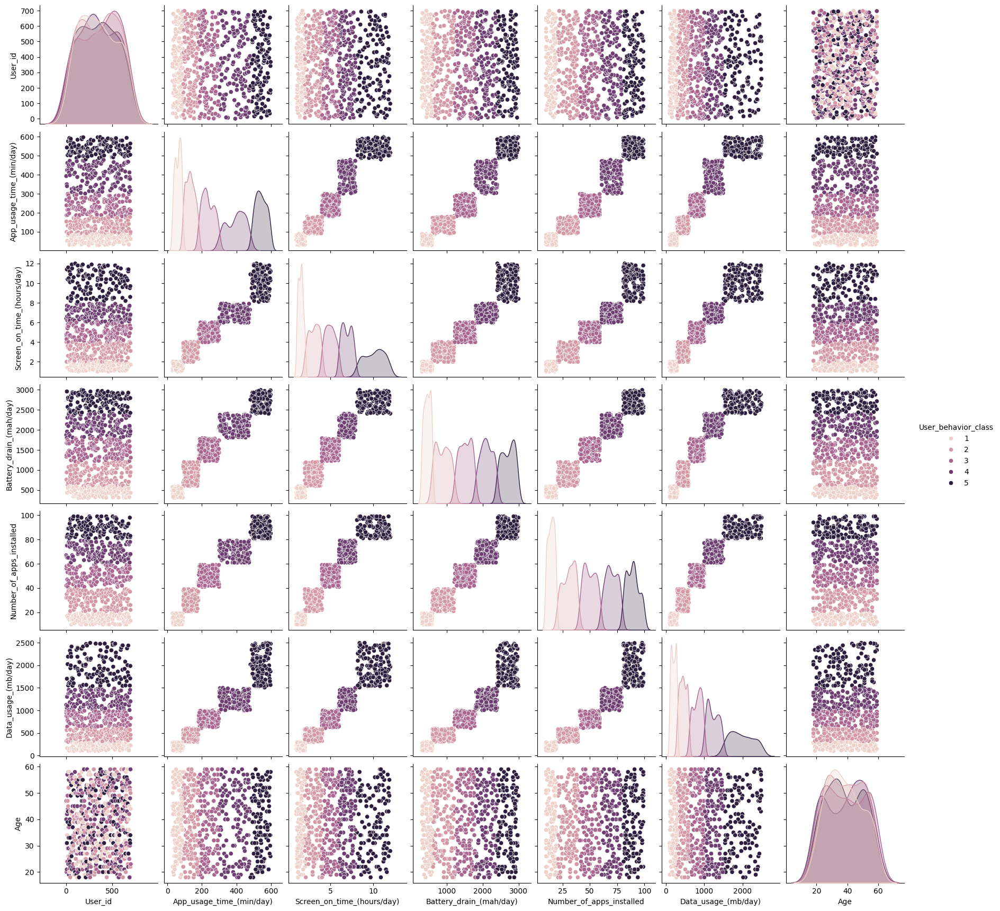

In [45]:
sns.pairplot(df, hue= 'User_behavior_class');

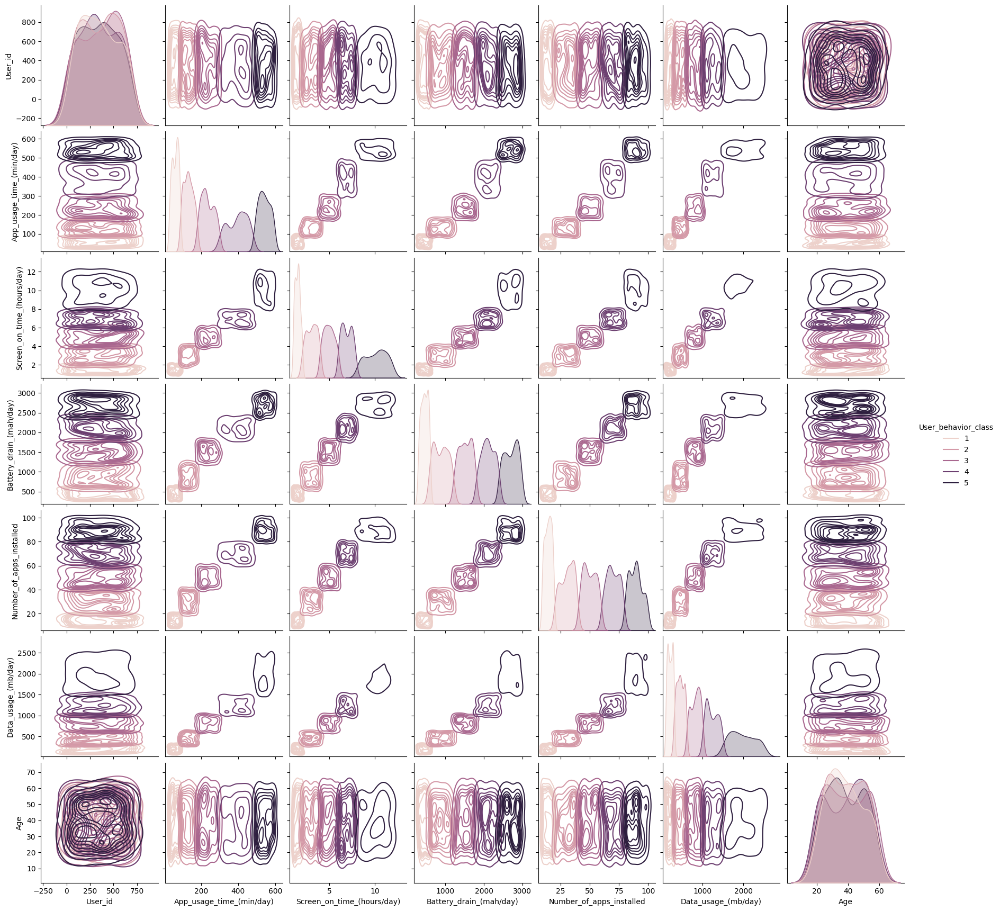

In [46]:
sns.pairplot(df, hue= 'User_behavior_class', kind= 'kde');

**splitting our data**

In [47]:
from sklearn.model_selection import train_test_split

In [48]:
df.head()

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


In [49]:
full_train = df.drop(columns=['User_id','Data_usage_(mb/day)'], axis= 1)
full_train.head()

,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Age,Gender,User_behavior_class
0,Google Pixel 5,Android,393,6.4,1872,67,40,Male,4
1,OnePlus 9,Android,268,4.7,1331,42,47,Female,3
2,Xiaomi Mi 11,Android,154,4.0,761,32,42,Male,2
3,Google Pixel 5,Android,239,4.8,1676,56,20,Male,3
4,iPhone 12,iOS,187,4.3,1367,58,31,Female,3


In [50]:
features = ['Device_model', 'Operating_system',
       'App_usage_time_(min/day)', 'Screen_on_time_(hours/day)',
       'Battery_drain_(mah/day)', 'Number_of_apps_installed',
       'Age', 'Gender', 'User_behavior_class']

In [51]:
X= df[features]
target = 'Data_usage_(mb/day)'
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(full_train,y, test_size=0.2, random_state=42)

In [52]:
from sklearn.feature_extraction import DictVectorizer
from sklearn.pipeline import make_pipeline

In [53]:
X_train = X_train.reset_index(drop= True)
X_train

,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Age,Gender,User_behavior_class
0,Xiaomi Mi 11,Android,330,7.2,2363,77,21,Female,4
1,Xiaomi Mi 11,Android,245,5.9,1243,52,29,Male,3
2,OnePlus 9,Android,433,6.8,2093,75,32,Male,4
3,Samsung Galaxy S21,Android,160,3.2,648,31,27,Female,2
4,OnePlus 9,Android,50,2.0,362,17,34,Female,1
...,...,...,...,...,...,...,...,...,...
555,iPhone 12,iOS,521,9.0,2902,97,37,Male,5
556,Google Pixel 5,Android,152,2.7,642,38,55,Male,2
557,Xiaomi Mi 11,Android,426,6.5,1969,78,53,Female,4
558,Xiaomi Mi 11,Android,105,3.4,798,21,34,Female,2


In [54]:
X_test = X_test.reset_index(drop= True)
X_test

,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Age,Gender,User_behavior_class
0,Samsung Galaxy S21,Android,304,6.5,2375,79,51,Male,4
1,Google Pixel 5,Android,66,1.3,369,14,32,Male,1
2,Xiaomi Mi 11,Android,78,1.1,437,14,27,Female,1
3,Xiaomi Mi 11,Android,158,3.4,893,36,32,Male,2
4,Google Pixel 5,Android,274,6.0,1489,56,57,Female,3
...,...,...,...,...,...,...,...,...,...
135,OnePlus 9,Android,216,4.0,1711,59,58,Male,3
136,iPhone 12,iOS,499,9.6,2873,81,52,Female,5
137,iPhone 12,iOS,140,3.8,1137,36,53,Male,2
138,Xiaomi Mi 11,Android,39,1.7,530,11,26,Female,1


In [55]:
y_train = y_train.reset_index(drop= True)
y_train

0      1133
1       885
2      1300
3       339
4       182
       ... 
555    1701
556     596
557    1266
558     467
559     565
Name: Data_usage_(mb/day), Length: 560, dtype: int64

In [56]:
y_test = y_test.reset_index(drop= True)
y_test

0      1493
1       195
2       143
3       493
4       666
       ... 
135     748
136    1805
137     506
138     268
139     459
Name: Data_usage_(mb/day), Length: 140, dtype: int64

In [57]:
train_dict = X_train.to_dict(orient='records')
test_dict = X_test.to_dict(orient='records')

In [58]:
dv = DictVectorizer(sparse=False)
dv.fit(train_dict)
X_train = dv.transform(train_dict)

In [59]:
X_test = dv.transform(test_dict)

In [60]:
dv.get_feature_names_out()

array(['Age', 'App_usage_time_(min/day)', 'Battery_drain_(mah/day)',
       'Device_model=Google Pixel 5', 'Device_model=OnePlus 9',
       'Device_model=Samsung Galaxy S21', 'Device_model=Xiaomi Mi 11',
       'Device_model=iPhone 12', 'Gender=Female', 'Gender=Male',
       'Number_of_apps_installed', 'Operating_system=Android',
       'Operating_system=iOS', 'Screen_on_time_(hours/day)',
       'User_behavior_class'], dtype=object)

**Training our model**

In [61]:
from sklearn.linear_model import LinearRegression

In [62]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [63]:
# predicting our training data

train_pred = model.predict(X_train)
train_pred[:5]

array([1309.08089947,  966.99894928, 1393.57716987,  498.53618013,
        140.0575056 ])

In [64]:
# importing some metrics

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [65]:
print(f'mae = {mean_absolute_error(y_train, train_pred)}')
print(f'mse = {mean_squared_error(y_train, train_pred)}')
print(f'r2score {r2_score(y_train, train_pred)}')

mae = 140.4105082677288
mse = 35547.78178714953
r2score 0.916020675195202


In [66]:
# making predictions

prediction = full_train.loc[11].to_dict()
prediction = dv.transform(prediction)

In [67]:
model.predict(prediction)[0]

881.448690606699

**predicting our test data**

In [68]:
test_pred = model.predict(X_test)
test_pred[:5]

array([1261.50885066,  143.85149148,  132.09734198,  563.40307454,
        980.43594593])

In [69]:
y_test[0:5]

0    1493
1     195
2     143
3     493
4     666
Name: Data_usage_(mb/day), dtype: int64

In [70]:
print(f'mae = {mean_absolute_error(y_test, test_pred)}')
print(f'mse = {mean_squared_error(y_test, test_pred)}')
print(f'r2score {r2_score(y_test, test_pred)}')

mae = 137.12712722039169
mse = 32707.302024980527
r2score 0.9069822159444104


In [71]:
df

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3
...,...,...,...,...,...,...,...,...,...,...,...
695,696,iPhone 12,iOS,92,3.9,1082,26,381,22,Male,2
696,697,Xiaomi Mi 11,Android,316,6.8,1965,68,1201,59,Male,4
697,698,Google Pixel 5,Android,99,3.1,942,22,457,50,Female,2
698,699,Samsung Galaxy S21,Android,62,1.7,431,13,224,44,Male,1


### **classifying mobile operating system**

**spliting data**

In [72]:
df_full_train = df.drop(columns='User_id', axis = 0)

In [73]:
train_set, test_set = train_test_split(df_full_train, test_size=0.2, random_state= 42)

In [74]:
len(train_set), len(test_set)

(560, 140)

In [75]:
train_set = train_set.reset_index(drop= True)
test_set = test_set.reset_index(drop= True)

In [76]:
y_train = train_set['Operating_system']
y_test = test_set['Operating_system']


In [77]:
del train_set['Operating_system']
del test_set['Operating_system']

### *converting our y_trian and test to numeric*

**Android = 1**

**iOS = 2**

In [78]:
d = {'Android': 1, 'iOS': 2}

In [79]:
y_train.unique()
y_train = y_train.map(d)

In [80]:
y_test = y_test.map(d)

In [81]:
# it's time to convert text to value
X = train_set.to_dict(orient= 'records')
X_1 = test_set.to_dict(orient = 'records')
vd = DictVectorizer(sparse= False)
vd.fit(X)
X_train = vd.transform(X)
X_test = vd.transform(X_1)

### *Training our model*

In [82]:
# from sklearn import tree
from sklearn.linear_model import LogisticRegression

In [83]:
logr = LogisticRegression(max_iter= 1000000)
logr.fit(X_train, y_train)

LogisticRegression(max_iter=1000000)

**Showing the probability it's 2 which is `ios`**

In [84]:
logr.predict_proba(X_train)[:, 1][0:5]

array([0.01537793, 0.01156375, 0.01465839, 0.01263951, 0.01236399])

In [85]:
logr.predict(X_train)[0:5]

array([1, 1, 1, 1, 1], dtype=int64)

**Predicting with our model using value from our training data**

In [86]:
pred = train_set.loc[3].to_dict()
pred = vd.transform(pred)
logr.predict_proba(pred)[0]

array([0.98736049, 0.01263951])

In [87]:
# predicting another value
pred = train_set.loc[40].to_dict()
pred = vd.transform(pred)
logr.predict_proba(pred)[0]

array([0.98712868, 0.01287132])

In [88]:
# predicting another value
pred = train_set.loc[6].to_dict()
pred = vd.transform(pred)
logr.predict_proba(pred)[0]

array([0.04646326, 0.95353674])

**Observation**
* *We could see that The particular user in row 3 has the `98%` probability of using an `Android` operating system and `1%` probability of using an `Ios` operating system*
* *We could see that The particular user in row 40 has the `98%` probability of using an `Android` operating system and `1%` probability of using an `Ios` operating system*
* *We could see that The particular user in row 40 has the `4%` probability of using an `Android` operating system and `95%` probability of using an `Ios` operating system*

**Conclusion:**
*We predicted 3 user application and we could see that 2 user out of three uses an `Andriod` operating system and the remaining person uses an `Ios` operating system*

______________

**Creating a dataframe to display our results**

In [89]:
df1 = pd.DataFrame()
df1['Actual'] = y_train
df1['Predicted'] = logr.predict(X_train)
df1['correct'] = df1['Actual'] == df1['Predicted']

df1

,Actual,Predicted,correct
0,1,1,True
1,1,1,True
2,1,1,True
3,1,1,True
4,1,1,True
...,...,...,...
555,2,2,True
556,1,1,True
557,1,1,True
558,1,1,True


In [90]:
df1.correct.mean()

1.0

**predicting our `X_test` data**

In [91]:
# Hard prediction

pred_x = logr.predict(X_test)
pred_x

array([1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1,
       1, 2, 2, 1, 2, 1, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1,
       1, 2, 1, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2,
       1, 1, 1, 1, 2, 2, 1, 1], dtype=int64)

In [92]:
# soft prediction

test_pred= logr.predict_proba(X_test)[:, 0]
# predicted_ios = (test_pred >= 0.5).astype(int)

In [93]:
df2 = pd.DataFrame()
df2['Actual'] = y_test
df2['Predicted'] = pred_x
df2['correct'] = df2['Actual'] == df2['Predicted']

df2['correct'].mean()

1.0

**Predicting with our model using value from our testing data**

In [94]:
predy= test_set.loc[9].to_dict()
predy= vd.transform(predy)
predictions= logr.predict(predy)
print(f'model predicted: {predictions[0]}')

model predicted: 2


*checking the accuracy and the classification report*

In [95]:
from sklearn.metrics import classification_report, accuracy_score

In [96]:
print(f"accuracy score: {accuracy_score(y_test, pred_x)}")
print(f"classification report: {classification_report(y_test,pred_x, target_names=['Android', 'Ios'])}")

accuracy score: 1.0
classification report:               precision    recall  f1-score   support

     Android       1.00      1.00      1.00       110
         Ios       1.00      1.00      1.00        30

    accuracy                           1.00       140
   macro avg       1.00      1.00      1.00       140
weighted avg       1.00      1.00      1.00       140



---------

**Making prediction with a function**

In [97]:
list(train_set.columns)

['Device_model',
 'App_usage_time_(min/day)',
 'Screen_on_time_(hours/day)',
 'Battery_drain_(mah/day)',
 'Number_of_apps_installed',
 'Data_usage_(mb/day)',
 'Age',
 'Gender',
 'User_behavior_class']

In [98]:
def usage(Device_model, App_usage_time, Screen_on_time, Battery_drain, Number_of_apps_installed , Data_usage, Age, Gender, User_behavior_class):
    data = {
    'Device_model': Device_model,
    'App_usage_time_(min/day)': App_usage_time,
    'Screen_on_time_(hours/day)': Screen_on_time,
    'Battery_drain_(mah/day)':  Battery_drain,
    'Number_of_apps_installed': Number_of_apps_installed,
    'Data_usage_(mb/day)': Data_usage,
    'Age': Age,
    'Gender': Gender,
    'User_behavior_class' : User_behavior_class
    }
    transformed_text = vd.transform(data)

    predicted = logr.predict(transformed_text)  

    return predicted[0]

Device_model = input('Enter Your device name:')
App_usage_time = input('Enter your app usage time:')
Screen_on_time = input('Enter your screen time usage:')
Battery_drain = input('Enter your battery drainage per mah:') 
Number_of_apps_installed = input('Enter number oof apps installed in your device:')
Data_usage = input('Enter Data usage per day:')
Age = input('Enter your Age')
Gender= input('Enter your gender')
User_behavior_class = input('Enter class') #from 1-5
predicted = usage(Device_model, App_usage_time, Screen_on_time, Battery_drain, Number_of_apps_installed , Data_usage, Age, Gender, User_behavior_class)
if predicted == 1:
    print("Predicted operating syatem is:",'Android')
else:
    print("Predicted operating syatem is:",'Ios')

Enter Your device name: itel A60
Enter your app usage time: 102
Enter your screen time usage: 1.3
Enter your battery drainage per mah: 1232
Enter number oof apps installed in your device: 123
Enter Data usage per day: 233
Enter your Age 16
Enter your gender Male
Enter class 2


Predicted operating syatem is: Android


>>>>>>>

### **Classification based on class**

In [99]:
df.head()

,User_id,Device_model,Operating_system,App_usage_time_(min/day),Screen_on_time_(hours/day),Battery_drain_(mah/day),Number_of_apps_installed,Data_usage_(mb/day),Age,Gender,User_behavior_class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


In [100]:
X_tr, X_te = train_test_split(df, test_size= 0.2, random_state=20)
y_train = X_tr['User_behavior_class']
y_test = X_te['User_behavior_class']

X_tr.drop(columns = 'User_id', inplace= True)
X_te.drop(columns= 'User_id', inplace= True)

In [101]:
del X_tr['User_behavior_class']
del X_te['User_behavior_class']

In [102]:
dict1 = X_tr.to_dict(orient= 'records')
dict2 = X_te.to_dict(orient= 'records')

ss = DictVectorizer(sparse= False)
X_train = ss.fit_transform(dict1)
X_test = ss.transform(dict2)

In [103]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text
from sklearn import tree
from sklearn.metrics import accuracy_score

In [104]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [105]:
pr = dt.predict(X_train)
print('score train =', accuracy_score(y_train, pr))

score train = 1.0


In [106]:
print(export_text(dt, feature_names=ss.get_feature_names_out()))

|--- App_usage_time_(min/day) <= 483.00
|   |--- Data_usage_(mb/day) <= 603.50
|   |   |--- App_usage_time_(min/day) <= 90.00
|   |   |   |--- class: 1
|   |   |--- App_usage_time_(min/day) >  90.00
|   |   |   |--- class: 2
|   |--- Data_usage_(mb/day) >  603.50
|   |   |--- Number_of_apps_installed <= 60.00
|   |   |   |--- class: 3
|   |   |--- Number_of_apps_installed >  60.00
|   |   |   |--- class: 4
|--- App_usage_time_(min/day) >  483.00
|   |--- class: 5



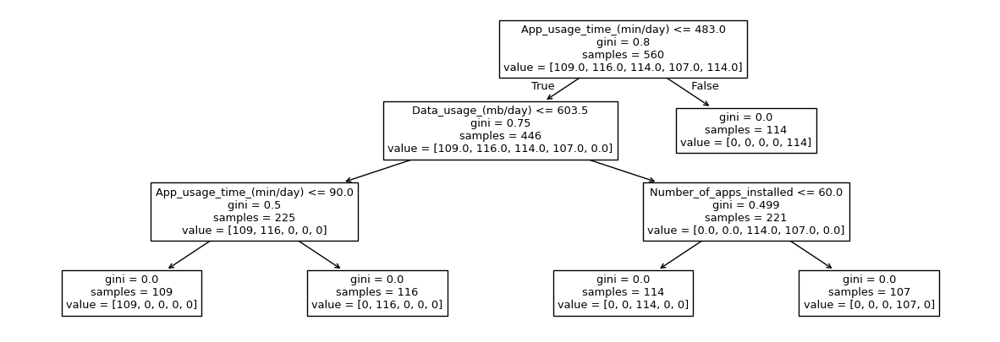

In [107]:
plt.figure(figsize=(15,5))
tree.plot_tree(dt, feature_names=ss.get_feature_names_out());

-----
**predicting our test set**

In [108]:
tt = dt.predict(X_test)
print('score test =', accuracy_score(y_test, tt))

score test = 0.9928571428571429


#### **making prediction with a function**

In [109]:
def behave(Device_model, Operating_system,App_usage_time, Screen_on_time, Battery_drain, Number_of_apps_installed , Data_usage, Age, Gender):
    data = {
    'Device_model': Device_model,
    'Operating_system': Operating_system,
    'App_usage_time_(min/day)': App_usage_time,
    'Screen_on_time_(hours/day)': Screen_on_time,
    'Battery_drain_(mah/day)':  Battery_drain,
    'Number_of_apps_installed': Number_of_apps_installed,
    'Data_usage_(mb/day)': Data_usage,
    'Age': Age,
    'Gender': Gender,
    }
    transformed_text = ss.transform(data)

    predicted = dt.predict(transformed_text)  

    return predicted[0]

Device_model = input('Enter Your device name:')
Operating_system = input('Enter Device operating system')
App_usage_time = input('Enter your app usage time:')
Screen_on_time = input('Enter your screen time usage:')
Battery_drain = input('Enter your battery drainage per mah:') 
Number_of_apps_installed = input('Enter number of apps installed in your device:')
Data_usage = input('Enter Data usage per day:')
Age = input('Enter your Age')
Gender= input('Enter your gender')

predicted = behave(Device_model, Operating_system ,App_usage_time, Screen_on_time, Battery_drain, Number_of_apps_installed , Data_usage, Age, Gender)

print(f"predicted = {predicted}")
# if predicted <= 2:
#     print(f"Low usage {prediction.}")
# elif predicted >= 3 & predicted <= 4:
#     print(f"Normal usage {prediction.}")
# else:
#     print(f"High usage {predicted}")

Enter Your device name: itel A60
Enter Device operating system Andrioid
Enter your app usage time: 32
Enter your screen time usage: 3.3
Enter your battery drainage per mah: 23
Enter number of apps installed in your device: 22
Enter Data usage per day: 33
Enter your Age 22
Enter your gender Female


predicted = 1


In [110]:
df.loc[100]

User_id                                  101
Device_model                  Google Pixel 5
Operating_system                     Android
App_usage_time_(min/day)                  41
Screen_on_time_(hours/day)               1.1
Battery_drain_(mah/day)                  389
Number_of_apps_installed                  15
Data_usage_(mb/day)                      136
Age                                       53
Gender                                  Male
User_behavior_class                        1
Name: 100, dtype: object

In [112]:
import pandoc